In [126]:
import numpy as np 
import pytesseract
import cv2
import matplotlib.pyplot as plt
import os
import re
import math

pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

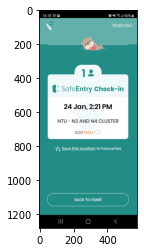

In [2]:
img = cv2.imread("screenshots/ntu_n3_n4.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [3]:
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
print(pytesseract.image_to_string(img))

16:18 © fad BALES ll 60%

.% What's this?

@ SafeEntry Check-in

24 Jan, 2:21PM

NTU - N3 AND N4 CLUSTER

GOVTECH

HA Save this location to Favourites

( BACK TO HOME )




In [138]:
def levenshtein(s, t):
    """ 
        Calculates levenshtein distance between two strings.
    """
    # Initialize matrix of zeros
    rows = len(s)+1
    cols = len(t)+1
    distance = np.zeros((rows,cols),dtype = int)

    # Populate matrix of zeros with the indeces of each character of both strings
    for i in range(1, rows):
        for k in range(1,cols):
            distance[i][0] = i
            distance[0][k] = k

    # Iterate over the matrix to compute the cost of deletions,insertions and/or substitutions    
    for col in range(1, cols):
        for row in range(1, rows):
            if s[row-1] == t[col-1]:
                cost = 0 # If the characters are the same in the two strings in a given position [i,j] then the cost is 0
            else:
                # In order to align the results with those of the Python Levenshtein package, if we choose to calculate the ratio
                # the cost of a substitution is 2. If we calculate just distance, then the cost of a substitution is 1.
                cost = 1
            distance[row][col] = min(distance[row-1][col] + 1,      # Cost of deletions
                                 distance[row][col-1] + 1,          # Cost of insertions
                                 distance[row-1][col-1] + cost)     # Cost of substitutions

    return distance[len(s)][len(t)]

def get_location_from_image(img, default_tesseract_cmd_path = r'C:\Program Files\Tesseract-OCR\tesseract.exe'):
    """
    img: image of tracetogether screenshot
    default_tesseract_cmd_path: Path of executable for tesseract
    """
    pytesseract.pytesseract.tesseract_cmd = default_tesseract_cmd_path

    data = pytesseract.image_to_data(img, output_type=pytesseract.Output.DATAFRAME)
    data = data.dropna()

    # data['top'] = data['top'].map(lambda x: int(math.ceil(x / 100.0) * 100))
    data['text'] = data.groupby(['block_num'])['text'].transform(lambda x: ' '.join(x))
    data = data.drop_duplicates(subset=['text'])
    data = data.sort_values(by=['top', 'left'])
    print(data)

    text_lines = data['text'].tolist()

    # Preprocessing string
    for i in range(len(text_lines)):
        text_lines[i] = re.sub('[!@#$_|&?]', '', text_lines[i]).strip()

    text_lines = [i.strip() for i in text_lines if len(i) > 5]

    index_of_location = -2
    for i in range(len(text_lines)):
        # 24 Jan, 2:21PM or 31 Feb
        if re.match(r'\d{1,2}\s*\w{3}[\,|\.]\s*\d{1,2}[\.|\:|\,]\d{2}\s*(AM|PM)', text_lines[i]):
            index_of_location = i + 1
            break
    
    if index_of_location < 0:
        for i in range(len(text_lines)): 
            if 'GOVTECH' in text_lines[i].upper():
                index_of_location = i - 1
                break
        
    if index_of_location < 0 or index_of_location >= len(text_lines):
        return "NOT FOUND"
        
    return text_lines[index_of_location].strip()

def get_bounding_box_of_text(img, text, default_tesseract_cmd_path = r'C:\Program Files\Tesseract-OCR\tesseract.exe'):
    """
    Gets the bounding box coordinates of the location on the phone

    img: RGB Image
    text: text to find bounding box for

    Returns (x_coordinate, y_coordinate, width_of_bounding_box, height_of_bounding_box)
    """
    pytesseract.pytesseract.tesseract_cmd = default_tesseract_cmd_path
    img_height, img_width = img.shape[:2]

    data = pytesseract.image_to_data(img, output_type=pytesseract.Output.DATAFRAME)
    data = data.dropna()
    data['text'] = data.groupby('block_num')['text'].transform(lambda x: ' '.join(x))
        
    # data = data[data['text'].str.contains(text, regex=False)]
    data = data[data.apply(lambda row: len(row['text'].strip()) > 5 and 
        ((row['text'] in text or text in row['text']) or 
        (levenshtein(row['text'], text) / len(text) < 0.2))
        , axis=1)]

    x1 = img_width
    y1 = img_height
    x2 = 0
    y2 = 0

    for index, row in data.iterrows():
        x_current_1, y_current_1 = row['left'], row['top']
        x_current_2, y_current_2 = row['left'] + row['width'], row['top'] + row['height'] 

        if x_current_1 < x1:
            x1 = x_current_1
        
        if y_current_1 < y1:
            y1 = y_current_1

        if x_current_2 > x2:
            x2 = x_current_2

        if y_current_2 > y2:
            y2 = y_current_2

    x = x1
    y = y1
    w = x2 - x1
    h = y2 - y1

    return (x, y, w, h)

def is_vaccinated_screenshot_color(r, g, b):
    return (r < g and r < b) or ((r < 180) and (r < g and r < b) and (g > 100 or b > 100))

def preprocess_img(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (3, 3), 0)
    thresh = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,5)
    dilate = cv2.dilate(thresh, np.ones((2, 2), np.uint8), iterations=1)
    thresh = cv2.threshold(dilate, 150, 150,cv2.THRESH_BINARY)[1]
    erode = cv2.erode(thresh, np.ones((2, 2), np.uint8), iterations=1)
    return cv2.addWeighted( erode, 50, erode, 0, 0)

    level  page_num  block_num  par_num  line_num  word_num  left   top  \
4       5         1          1        1         1         1   445   150   
16      5         1          3        1         1         1   322   153   
22      5         1          4        1         1         1  1318   263   
8       5         1          2        1         1         1   401   284   
26      5         1          5        1         1         1  1320   788   
39      5         1          6        1         1         1   616   856   
52      5         1          8        1         1         1   716  1012   
59      5         1          9        1         1         1   512  1044   
68      5         1         10        1         1         1   677  1130   
82      5         1         12        1         1         1   184  1207   
77      5         1         11        1         1         1   812  1219   
88      5         1         13        1         1         1   346  3224   

    width  height       

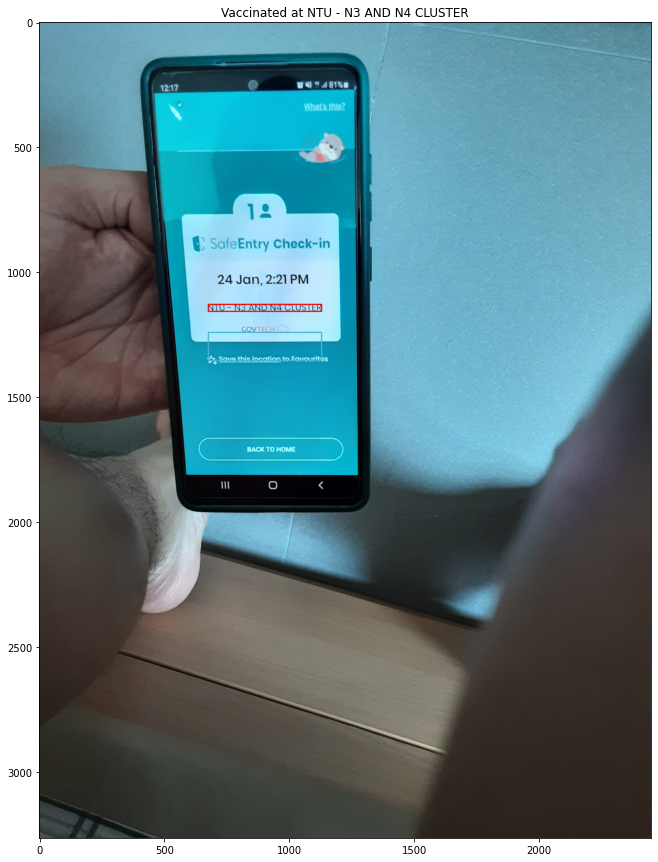

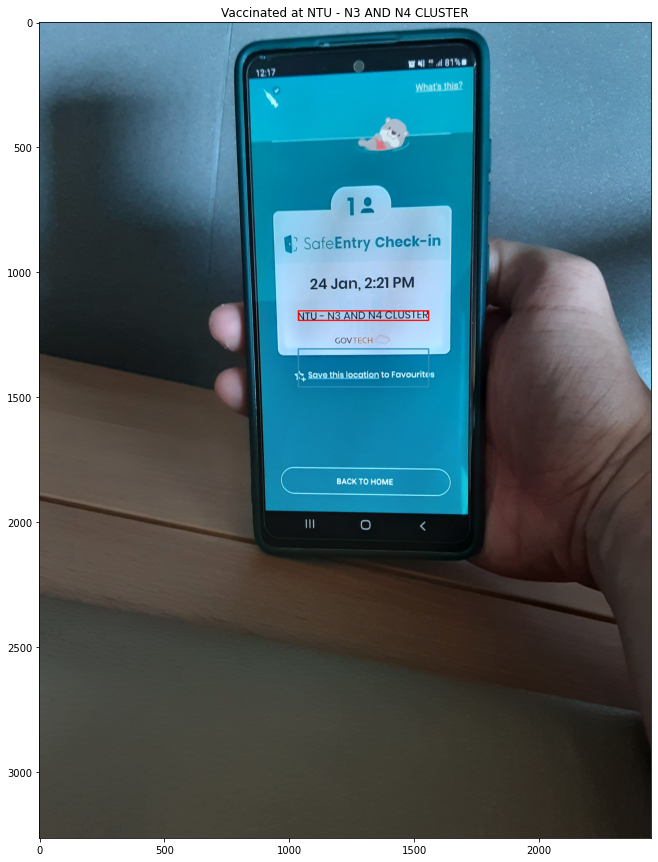

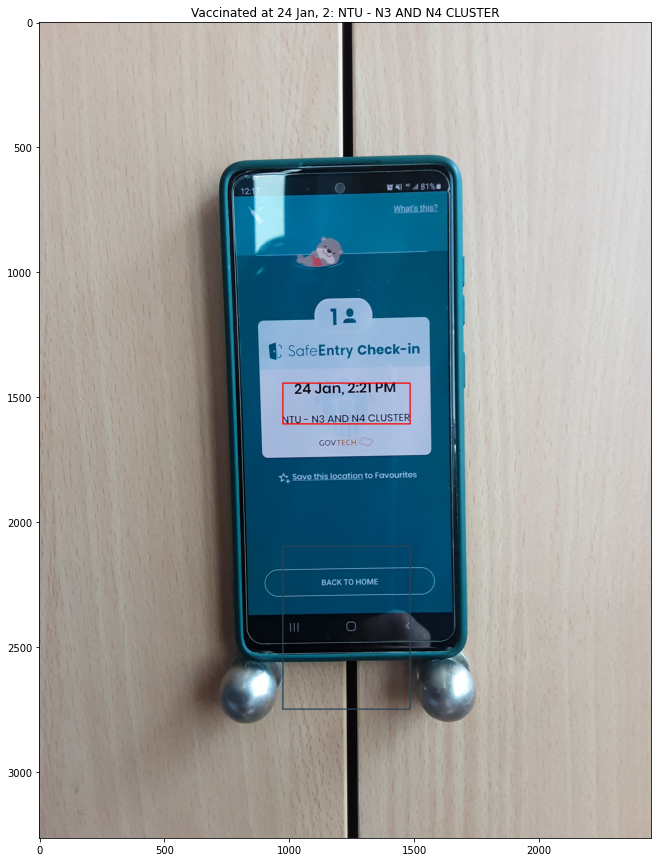

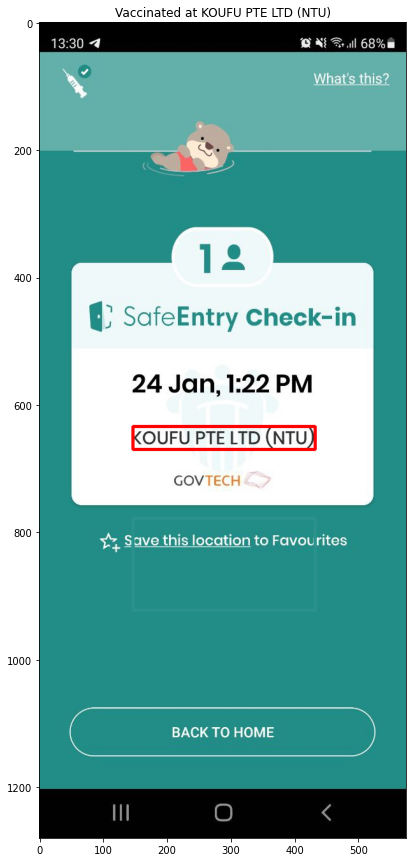

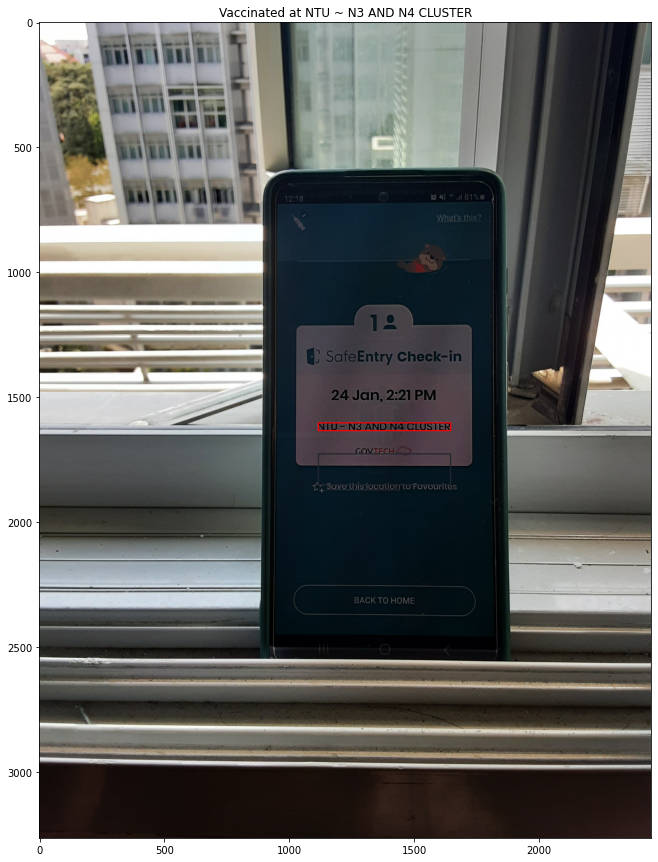

...

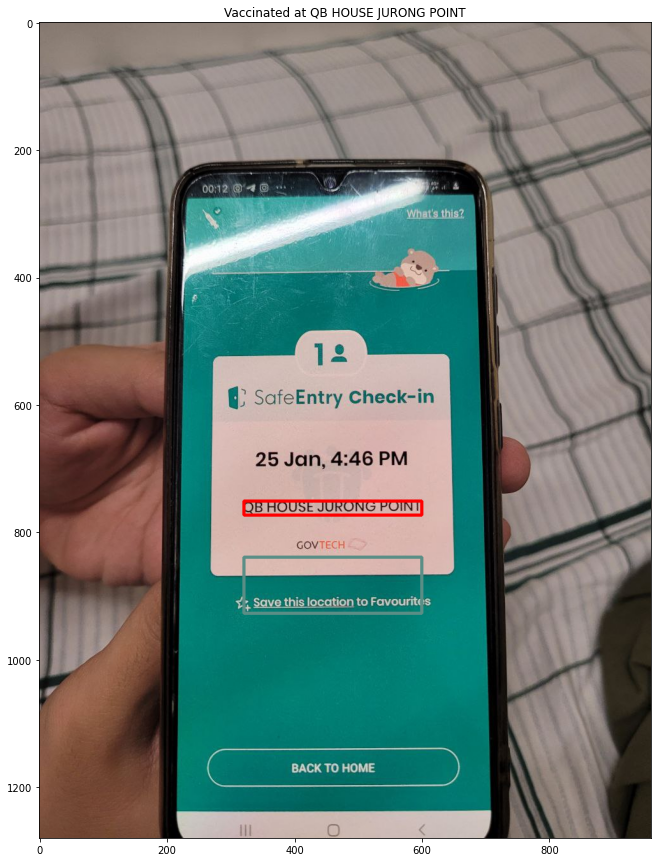

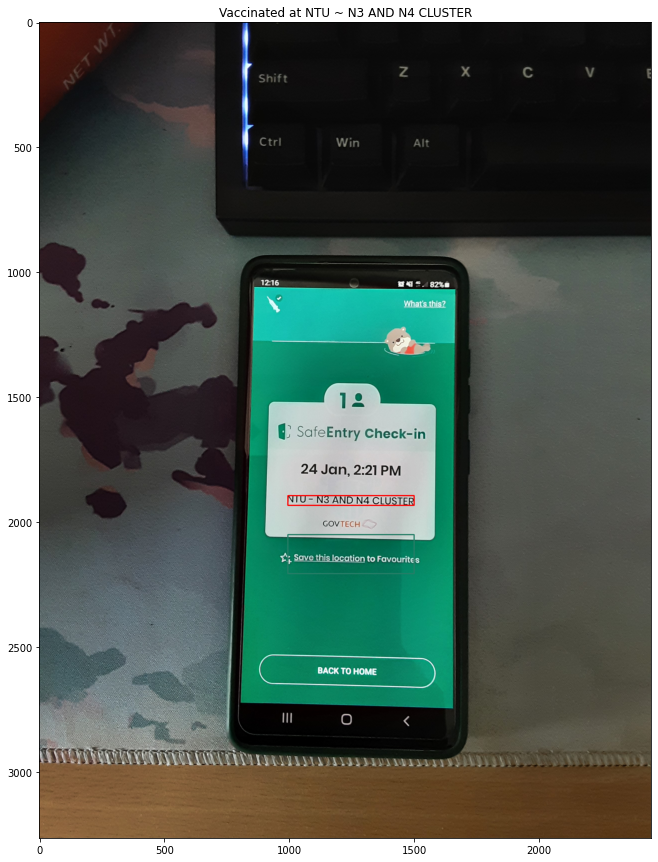

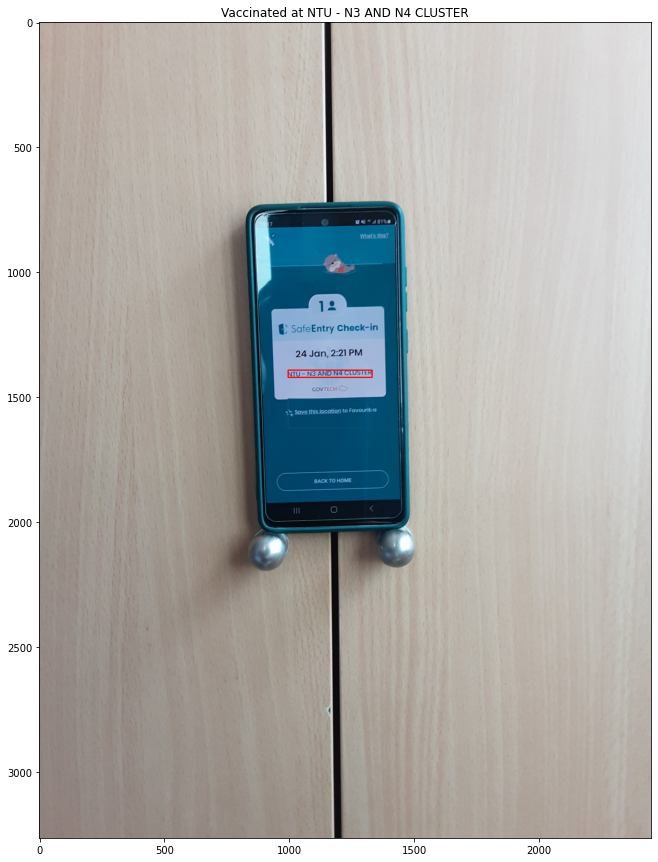

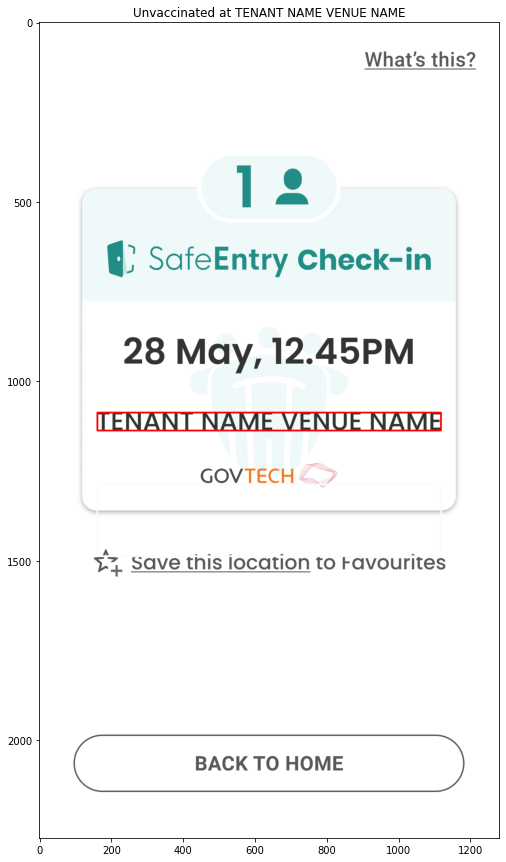

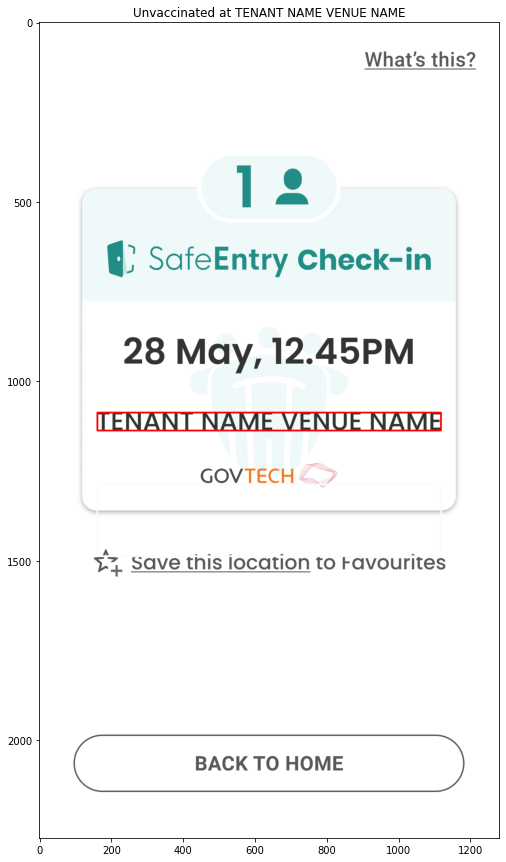

In [139]:
BASE_DIR = 'screenshots'
for f in os.listdir(BASE_DIR):
    image_path = os.path.join(BASE_DIR, f)

    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    preprocessed_img = preprocess_img(img)

    # location = get_location_from_image(img)
    location = get_location_from_image(preprocessed_img)
    x, y, w, h = get_bounding_box_of_text(preprocessed_img, location)

    img = cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 3)
    y += 4 * h
    h *= 4

    roi = img[y:y+h, x:x+w]
    r, g, b, a = cv2.mean(roi)
    r = int(r)
    g = int(g)
    b = int(b)

    is_vaccinated = is_vaccinated_screenshot_color(r, g, b)

    img = cv2.rectangle(img, (x, y), (x + w, y + h), (r, g, b), 3)
    plt.figure(figsize=(15, 15))
    plt.title("{} at {}".format("Vaccinated" if is_vaccinated else "Unvaccinated", location))
    plt.imshow(img)

In [15]:
img_location = "NTU- N3 AND N4 CLUSTER"
location = "NTU - N3 and N4 CLUSTER"
if img_location != location and img_location.lower().replace(' ', '') != location.lower().replace(' ', ''):
    print("Dont match")
else:
    print("match")

match


    level  page_num  block_num  par_num  line_num  word_num  left   top  \
4       5         1          1        1         1         1  1653  1021   
8       5         1          2        1         1         1     0  1423   
12      5         1          3        1         1         1  1388   644   
13      5         1          3        1         1         2  1554   641   
15      5         1          3        1         2         1  1416   731   
19      5         1          4        1         1         1   717     0   
23      5         1          5        1         1         1  1477  1284   
25      5         1          5        1         2         1  1283  1443   
26      5         1          5        1         2         2  1348  1441   
30      5         1          6        1         1         1  1122  1671   
31      5         1          6        1         1         2  1279  1668   
35      5         1          7        1         1         1  1024  1447   
36      5         1      

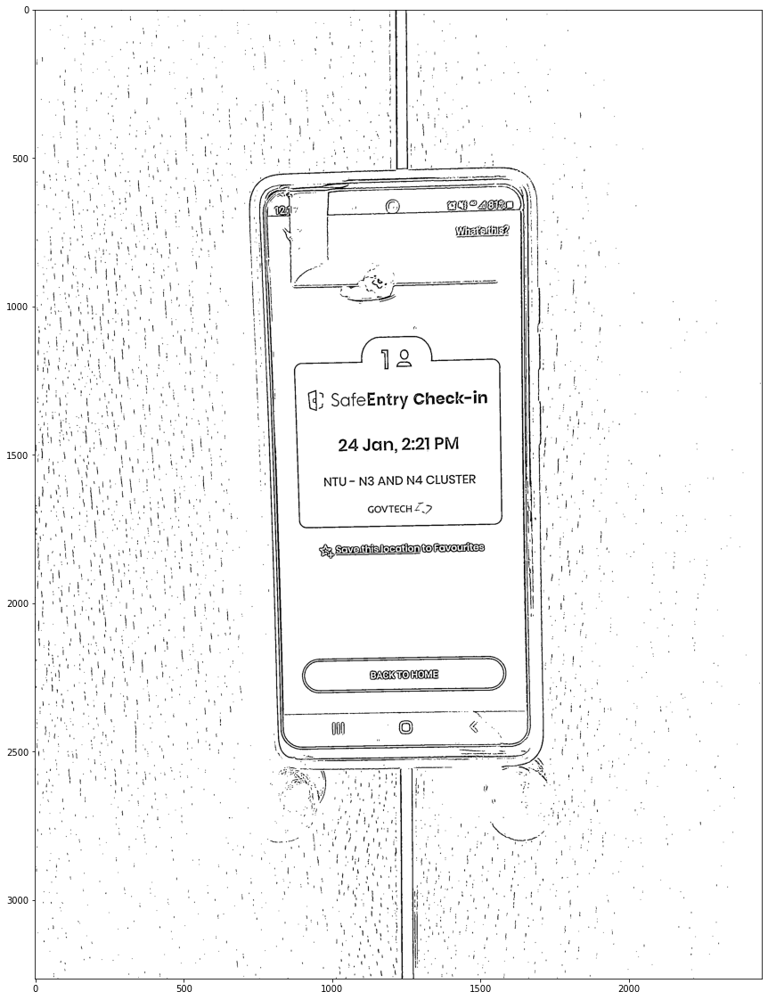

In [129]:
# img = cv2.imread(r'C:\Users\Amp\Desktop\Programming\detect-vaccination\screenshots\photo1643135276.jpeg')
img = cv2.imread('screenshots/asdf.jpg')


img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# height, width = img.shape[:2]
# img = cv2.resize(img, (width * 2, height * 2))
# erode = preprocess_img(img)

# plt.figure(figsize=(20, 20))
# plt.imshow(cv2.cvtColor(erode, cv2.COLOR_BGR2RGB))

# data = pytesseract.image_to_data(erode, output_type=pytesseract.Output.DATAFRAME)
# data = data.dropna()
# data['text'] = data.groupby('block_num')['text'].transform(lambda x: ' '.join(x))
# data = data.drop_duplicates(subset=['text'])

# text_lines = data['text'].tolist()
# text_lines
p_img = preprocess_img(img)
print(get_location_from_image(p_img))

plt.figure(figsize=(20, 20))
plt.imshow(cv2.cvtColor(p_img, cv2.COLOR_BGR2RGB))
    

# data = data[data.apply(lambda row: (row['text'] in text or text in row['text']) and len(row['text'].strip()) > 5, axis=1)]



# img_width, img_height = img.shape[:2]
# x1 = img_width
# y1 = img_height
# x2 = 0
# y2 = 0

# for index, row in data.iterrows():
#     x_current_1, y_current_1 = row['left'], row['top']
#     x_current_2, y_current_2 = row['left'] + row['width'], row['top'] + row['height'] 

#     if x_current_1 < x1:
#         x1 = x_current_1
    
#     if y_current_1 < y1:
#         y1 = y_current_1

#     if x_current_2 > x2:
#         x2 = x_current_2

#     if y_current_2 > y2:
#         y2 = y_current_2

# x = x1
# y = y1
# w = x2 - x1
# h = y2 - y1

    
# # data = data[data['text'].str.contains(text, regex=False)]
# # data = data[data.apply(lambda row: levenshtein(row['text'], text) / len(text) < 0.2, axis=1)]
# # data

# img = cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 3)
# y += 4 * h
# h *= 4

# roi = img[y:y+h, x:x+w]
# r, g, b, a = cv2.mean(roi)
# r = int(r)
# g = int(g)
# b = int(b)

# # print(location)
# img = cv2.rectangle(img, (x, y), (x + w, y + h), (r, g, b), 3)
# plt.figure(figsize=(15, 15))
# plt.imshow(img)

In [62]:
data['text'] = data['text'].map(lambda x: x + " " + x)
data

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
23,5,1,5,1,1,1,1477,1284,46,44,94.553154,in 21 PM in 21 PM
25,5,1,5,1,2,1,1283,1443,45,46,75.236603,in 21 PM in 21 PM
26,5,1,5,1,2,2,1348,1441,79,42,75.236603,in 21 PM in 21 PM
